## Necessary Imports

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.preprocessing.image import array_to_img
from scipy.linalg import sqrtm
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
warnings.filterwarnings('ignore')

## Load the files

In [3]:
BASE_DIR = '/kaggle/input/anime-faces/data'

In [4]:
# load complete image paths to the list
image_paths = []
for image_name in os.listdir(BASE_DIR):
    image_path = os.path.join(BASE_DIR, image_name)
    image_paths.append(image_path)

In [5]:
image_paths[:5]

['/kaggle/input/anime-faces/data/21130.png',
 '/kaggle/input/anime-faces/data/9273.png',
 '/kaggle/input/anime-faces/data/18966.png',
 '/kaggle/input/anime-faces/data/14127.png',
 '/kaggle/input/anime-faces/data/18054.png']

In [6]:
# remove unnecessary file
image_paths.remove('/kaggle/input/anime-faces/data/data')

In [7]:
len(image_paths)

21551

## Visualize the Image Dataset

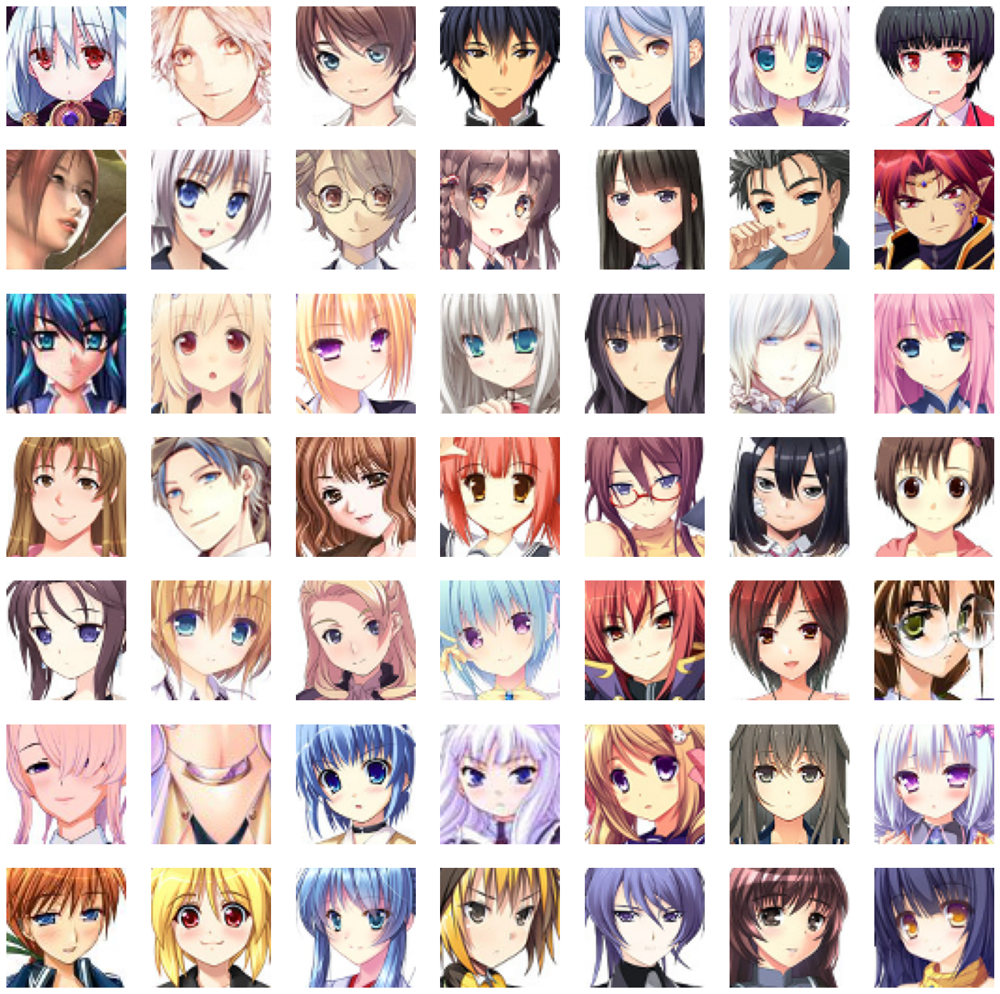

In [8]:
# to display grid of images (7x7)
plt.figure(figsize=(20, 20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7, 7, index)
    # load the image
    img = load_img(image_path)
    # convert to numpy array
    img = np.array(img)
    # show the image
    plt.imshow(img)
    plt.axis('off')
    # increment the index for next image
    index += 1

## Preprocess Images

In [9]:
# load the image and convert to numpy array
train_images = [np.array(load_img(path)) for path in tqdm(image_paths)]
train_images = np.array(train_images)

  0%|          | 0/21551 [00:00<?, ?it/s]

In [10]:
train_images[0].shape

(64, 64, 3)

In [11]:
# reshape the array
train_images = train_images.reshape(train_images.shape[0], 64, 64, 3).astype('float32')

In [12]:
# normalize the images
train_images = (train_images - 127.5) / 127.5

In [13]:
train_images[0]

array([[[-0.7254902 , -0.90588236, -0.7176471 ],
        [-0.70980394, -0.88235295, -0.6862745 ],
        [-0.7019608 , -1.        , -0.7176471 ],
        ...,
        [-0.09019608,  0.01176471,  0.3882353 ],
        [-0.19215687,  0.05882353,  0.4509804 ],
        [-0.34117648, -0.13725491,  0.29411766]],

       [[-0.7254902 , -0.90588236, -0.7176471 ],
        [-0.73333335, -0.8666667 , -0.7019608 ],
        [-0.52156866, -0.8666667 , -0.5686275 ],
        ...,
        [-0.29411766,  0.01176471,  0.3019608 ],
        [-0.08235294,  0.15294118,  0.5294118 ],
        [-0.23921569,  0.09019608,  0.45882353]],

       [[-0.7019608 , -0.8901961 , -0.7019608 ],
        [-0.7176471 , -0.8745098 , -0.69411767],
        [-0.5686275 , -0.8509804 , -0.58431375],
        ...,
        [-0.22352941,  0.1764706 ,  0.48235294],
        [-0.13725491,  0.1764706 ,  0.4745098 ],
        [-0.06666667,  0.24705882,  0.5058824 ]],

       ...,

       [[-0.30980393, -0.6862745 , -0.29411766],
        [-0

## Create Generator & Discriminator Models

In [14]:
# latent dimension for random noise
LATENT_DIM = 100
# weight initializer
WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# no. of channels of the image
CHANNELS = 3 # for gray scale, keep it as 1

### Generator Model

Generator Model will create new images similar to training data from random noise

In [15]:
model = Sequential(name='generator')

# 1d random noise
model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# convert 1d to 3d
model.add(layers.Reshape((8, 8, 512)))

# upsample to 16x16
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 32x32
model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 64x64
model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh'))

generator = model
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     3,309,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,408 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,065,603 (23.14 MB)

 Trainable params: 6,065,603 (23.14 MB)

 Non-trainable params: 0 (0.00 B)

### Discriminator Model

Discriminator model will classify the image from the generator to check whether it real (or) fake images.

In [16]:
model = Sequential(name='discriminator')
input_shape = (64, 64, 3)
alpha = 0.2

# create conv layers
model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

# output class
model.add(layers.Dense(1, activation='sigmoid'))

discriminator = model
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

## Create DCGAN

In [17]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')
        
    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]
    
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
        
    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generate random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))
        
        # train the discriminator with real (1) and fake (0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real = self.discriminator(real_images, training=True)
            # generate real image labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)
            
            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            # generate fake labels
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)
            
            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2
            
        # compute discriminator gradients
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))
        
        
        # train the generator model
        labels = tf.ones((batch_size, 1))
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training=True)
            # classify images as real or fake
            pred_fake = self.discriminator(fake_images, training=True)
            # compute loss
            g_loss = self.loss_fn(labels, pred_fake)
            
        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))
        
        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        
        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

In [18]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=8, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # create random noise for generating images for each row
        self.noise_row1 = tf.random.normal([4, latent_dim])
        self.noise_row2 = tf.random.normal([4, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # Generate images for the first row
        g_img_row1 = self.model.generator(self.noise_row1)
        g_img_row1 = (g_img_row1 * 127.5) + 127.5
        g_img_row1 = g_img_row1.numpy()

        # Generate images for the second row
        g_img_row2 = self.model.generator(self.noise_row2)
        g_img_row2 = (g_img_row2 * 127.5) + 127.5
        g_img_row2 = g_img_row2.numpy()

        fig, axs = plt.subplots(2, 4, figsize=(12, 6))

        # Plot images for the first row
        for i in range(4):
            img = array_to_img(g_img_row1[i])
            axs[0, i].imshow(img)
            axs[0, i].axis('off')

        # Plot images for the second row
        for i in range(4):
            img = array_to_img(g_img_row2[i])
            axs[1, i].imshow(img)
            axs[1, i].axis('off')

        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [19]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

In [20]:
D_LR = 0.0001 
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/50
  5/674 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - d_loss: 1.3512 - g_loss: 0.5612 

I0000 00:00:1715520614.852945     140 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1715520614.875057     140 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


674/674 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 1.2253 - g_loss: 1.9116

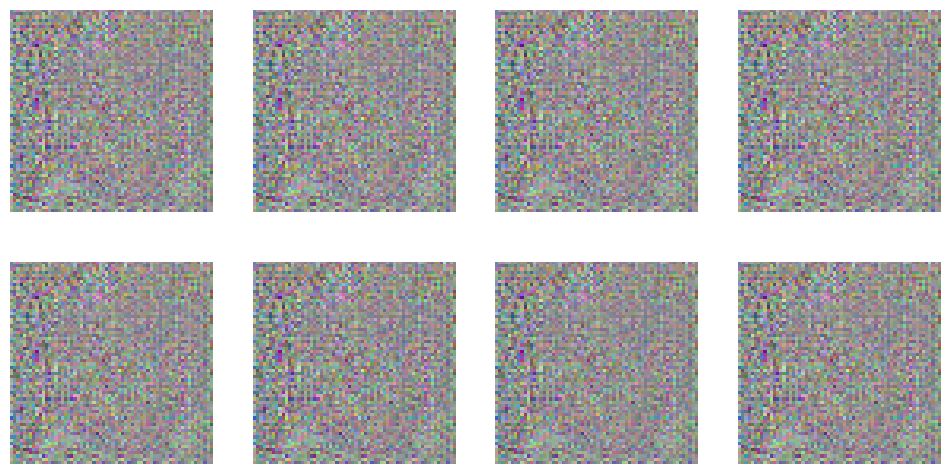

674/674 ━━━━━━━━━━━━━━━━━━━━ 51s 48ms/step - d_loss: 1.2244 - g_loss: 1.9129
Epoch 2/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.3027 - g_loss: 2.8888

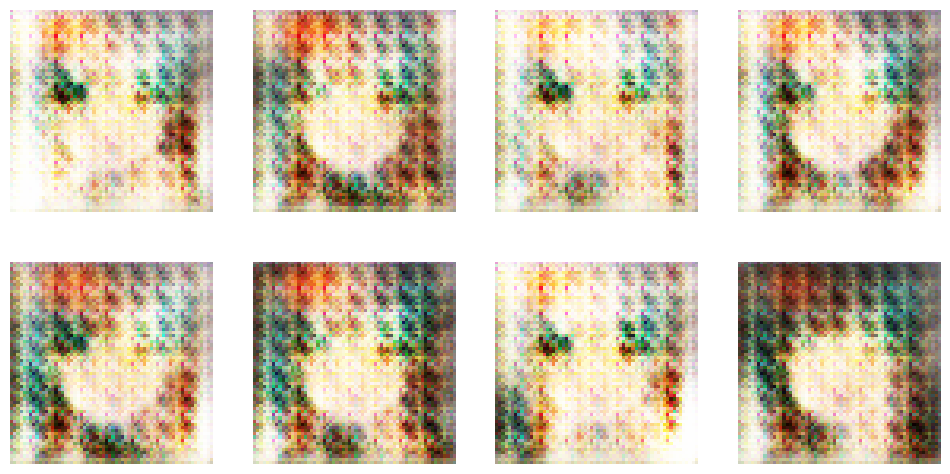

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.3032 - g_loss: 2.8869
Epoch 3/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.5652 - g_loss: 1.8057

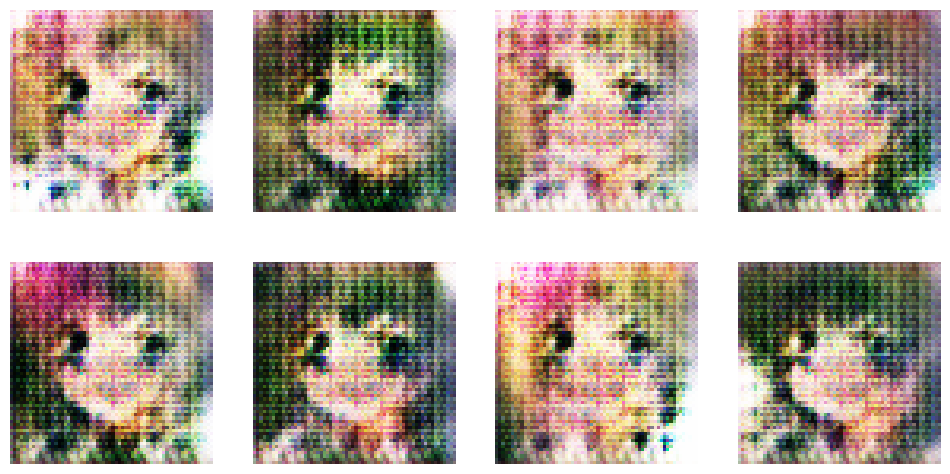

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.5653 - g_loss: 1.8059
Epoch 4/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.6258 - g_loss: 1.6922

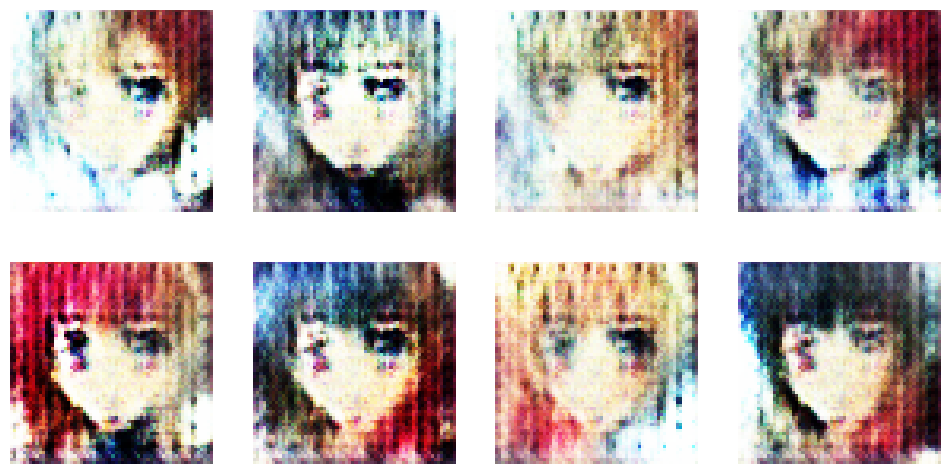

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6258 - g_loss: 1.6920
Epoch 5/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.6327 - g_loss: 1.4946

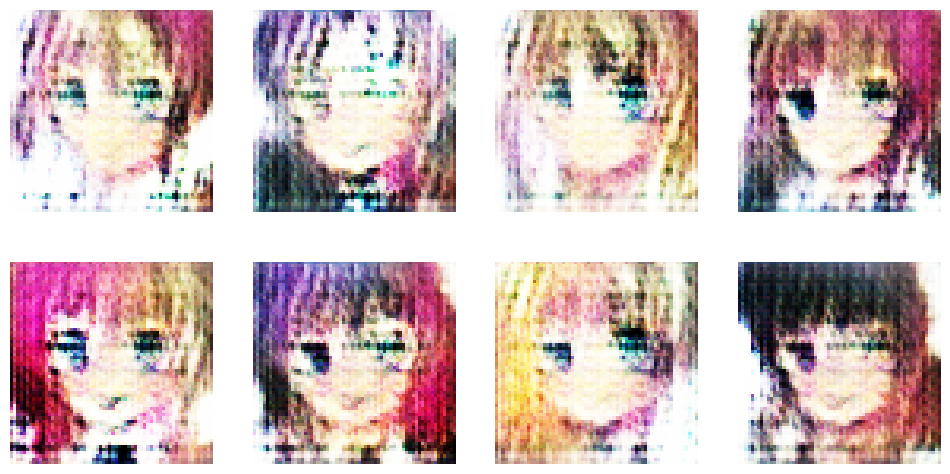

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6328 - g_loss: 1.4945
Epoch 6/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.6076 - g_loss: 1.5045

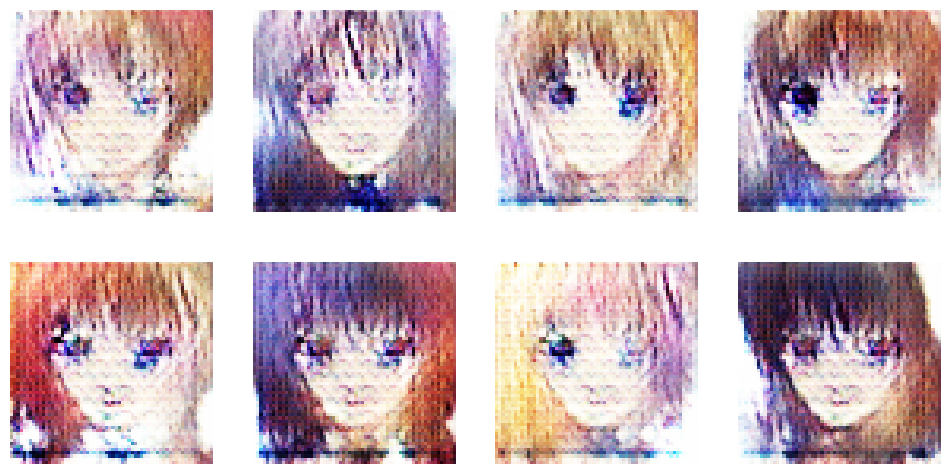

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6076 - g_loss: 1.5046
Epoch 7/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.5768 - g_loss: 1.6402

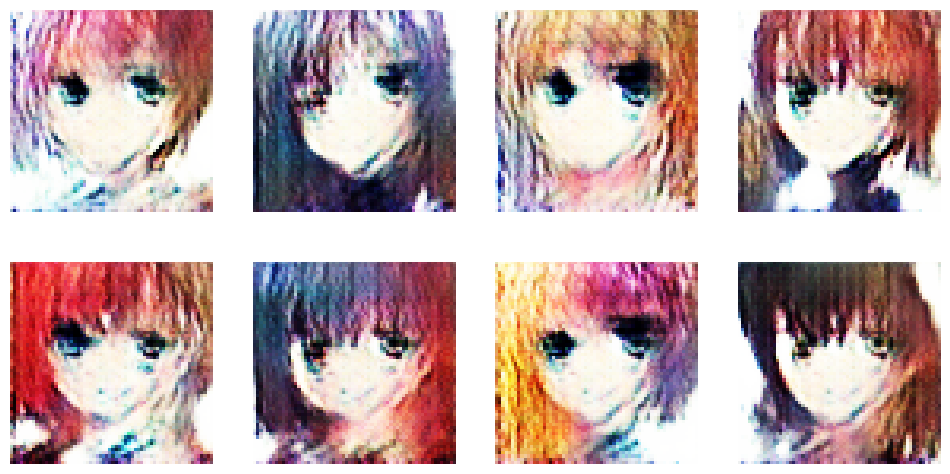

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.5768 - g_loss: 1.6402
Epoch 8/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.5902 - g_loss: 1.5240

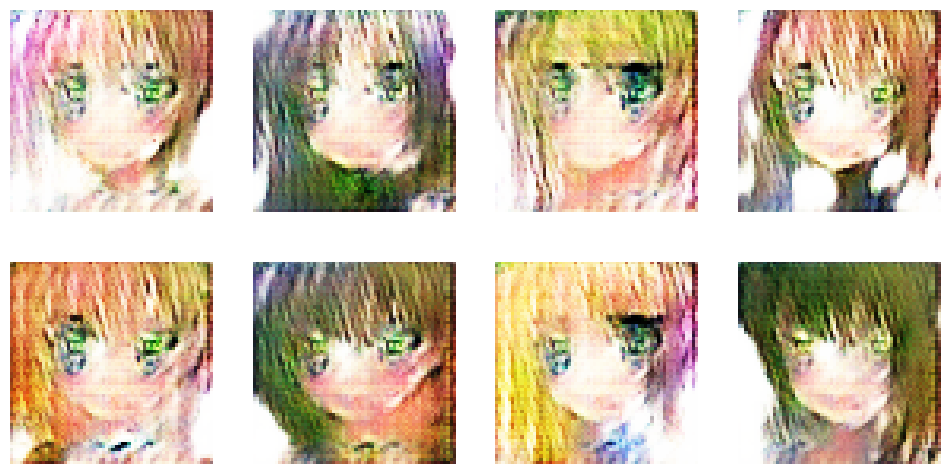

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.5902 - g_loss: 1.5241
Epoch 9/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.5840 - g_loss: 1.4756

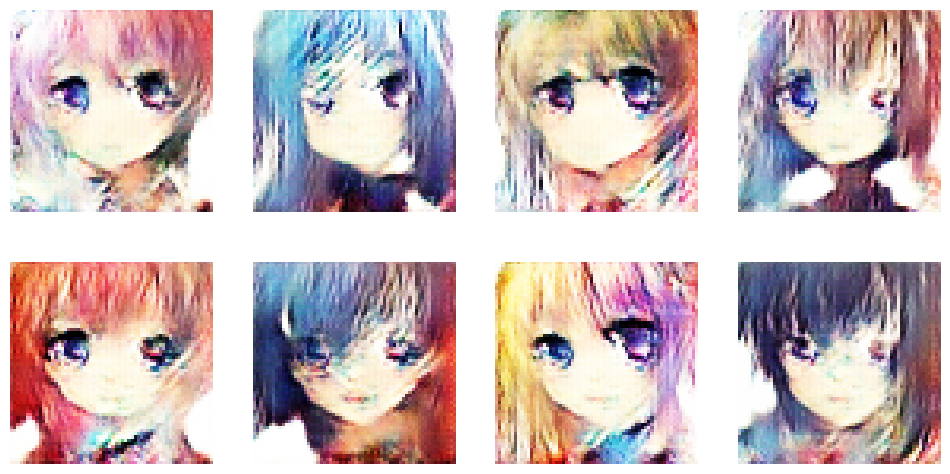

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - d_loss: 0.5841 - g_loss: 1.4755
Epoch 10/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 0.6549 - g_loss: 1.1937

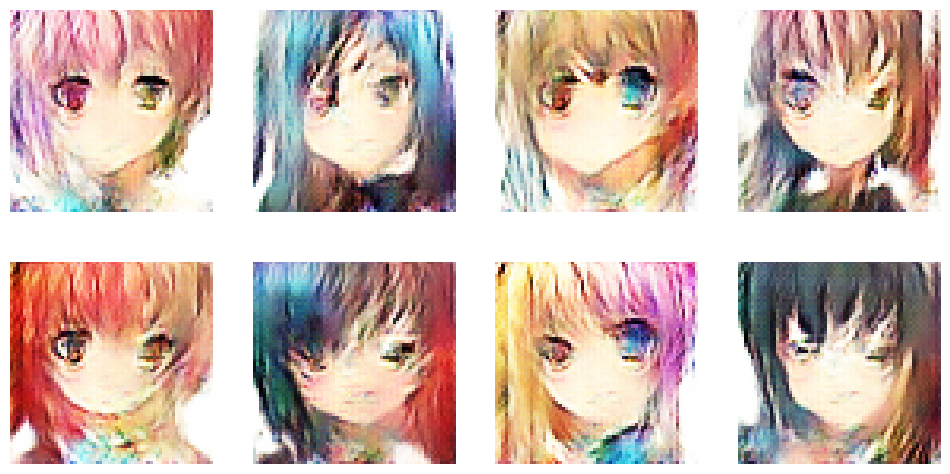

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6550 - g_loss: 1.1935
Epoch 11/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6789 - g_loss: 1.0457

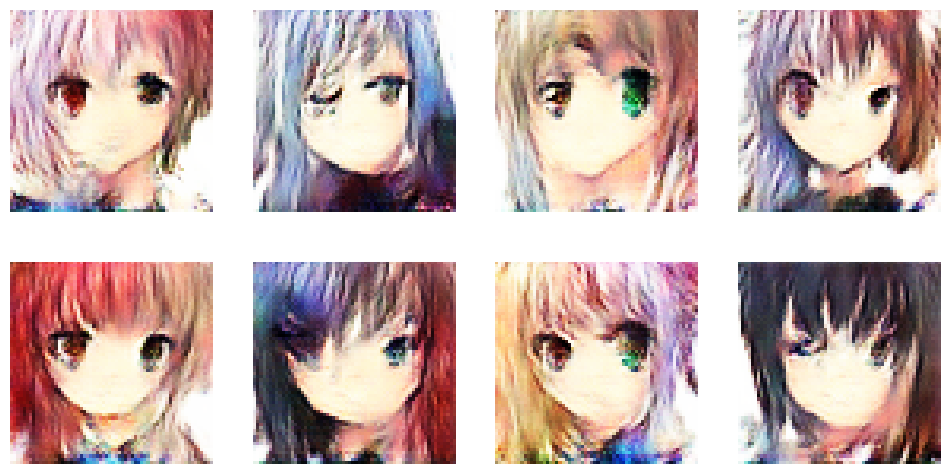

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6789 - g_loss: 1.0457
Epoch 12/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6850 - g_loss: 1.0011

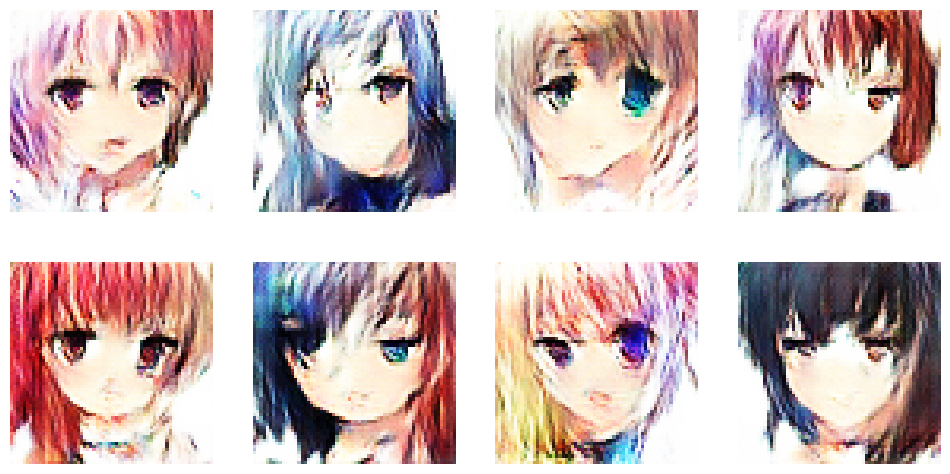

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6850 - g_loss: 1.0011
Epoch 13/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6980 - g_loss: 0.9347

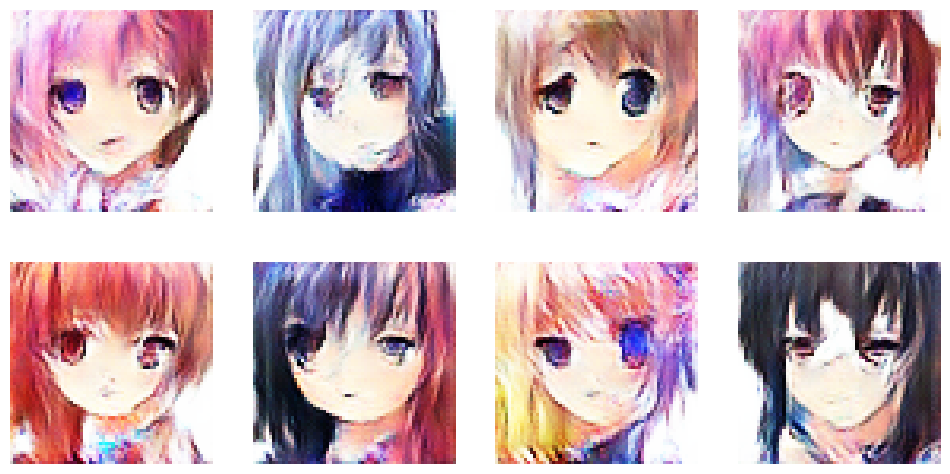

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6980 - g_loss: 0.9347
Epoch 14/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.7035 - g_loss: 0.8927

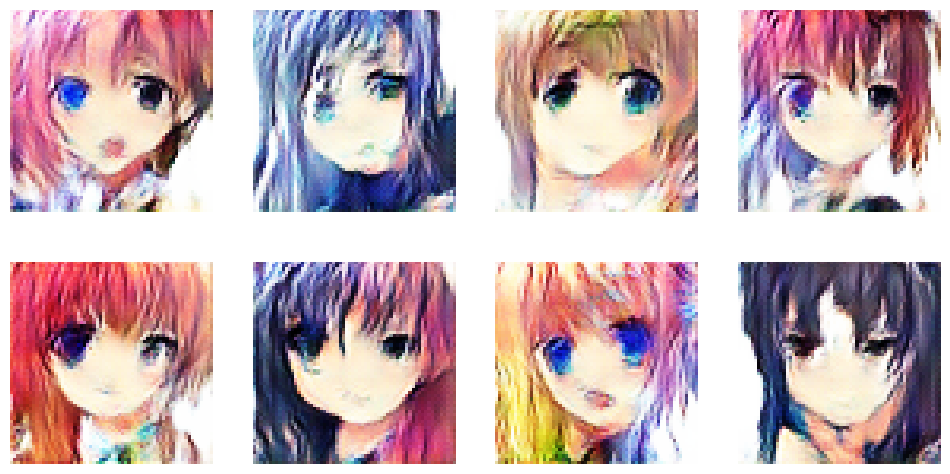

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.7035 - g_loss: 0.8926
Epoch 15/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.7065 - g_loss: 0.8589

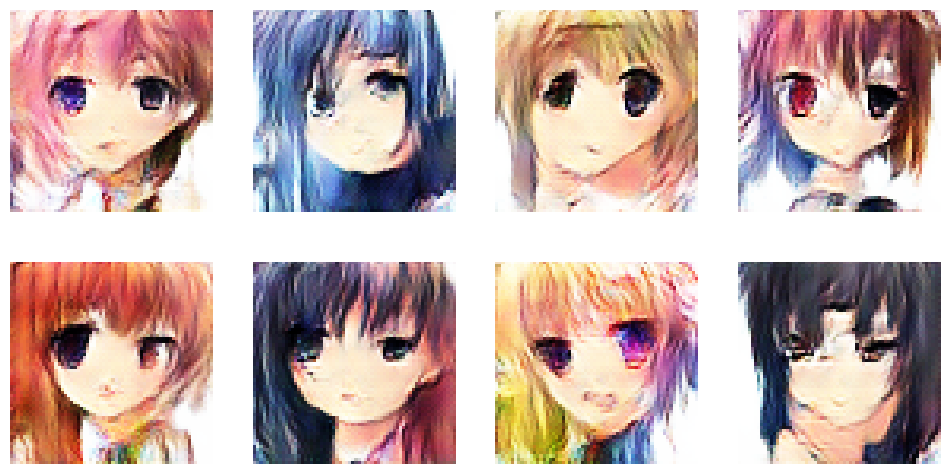

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.7065 - g_loss: 0.8589
Epoch 16/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.7064 - g_loss: 0.8392

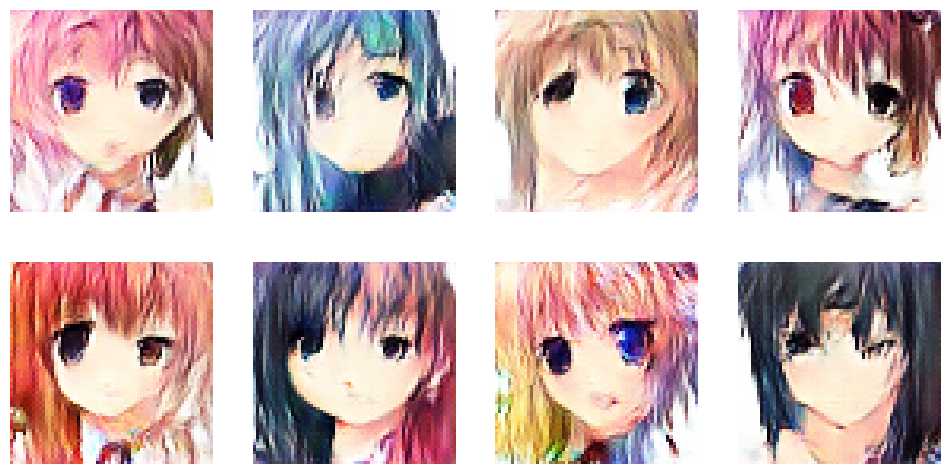

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.7064 - g_loss: 0.8392
Epoch 17/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.7040 - g_loss: 0.8312

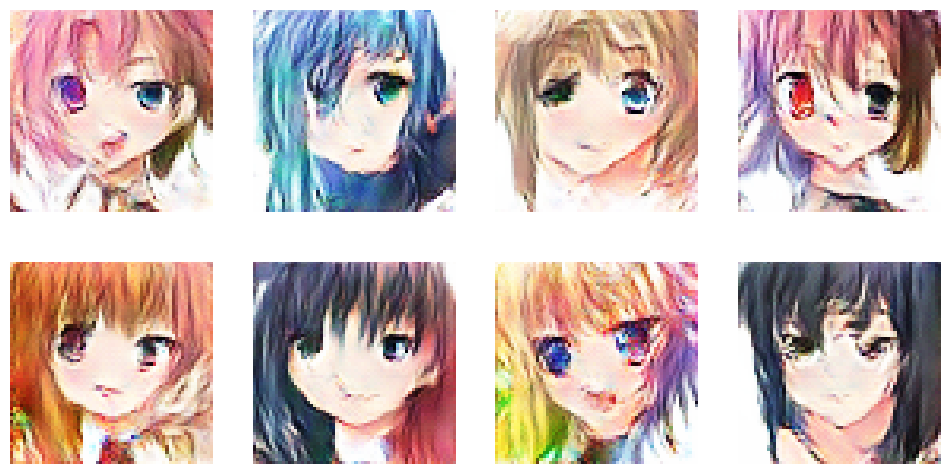

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.7040 - g_loss: 0.8312
Epoch 18/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6990 - g_loss: 0.8126

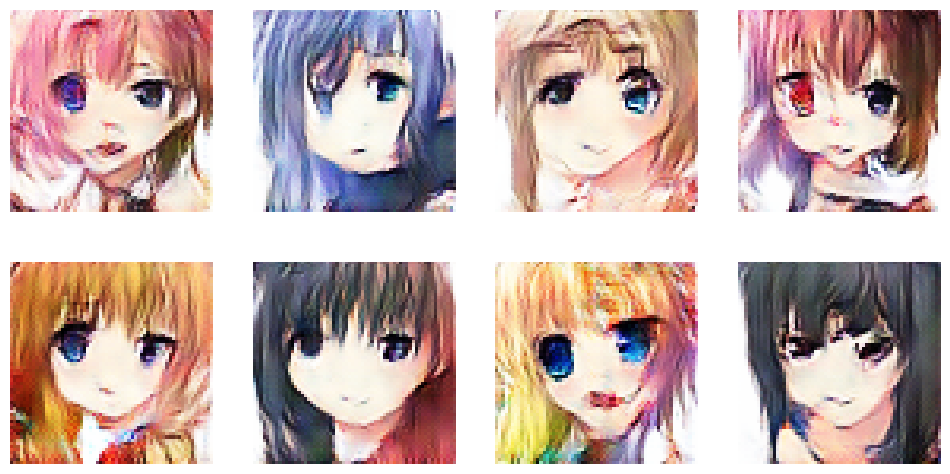

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6991 - g_loss: 0.8126
Epoch 19/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6977 - g_loss: 0.8065

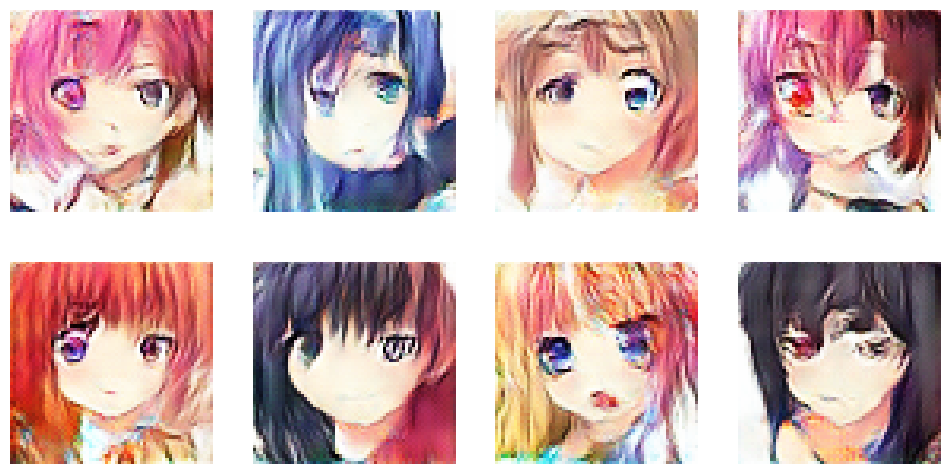

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6977 - g_loss: 0.8065
Epoch 20/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6948 - g_loss: 0.7941

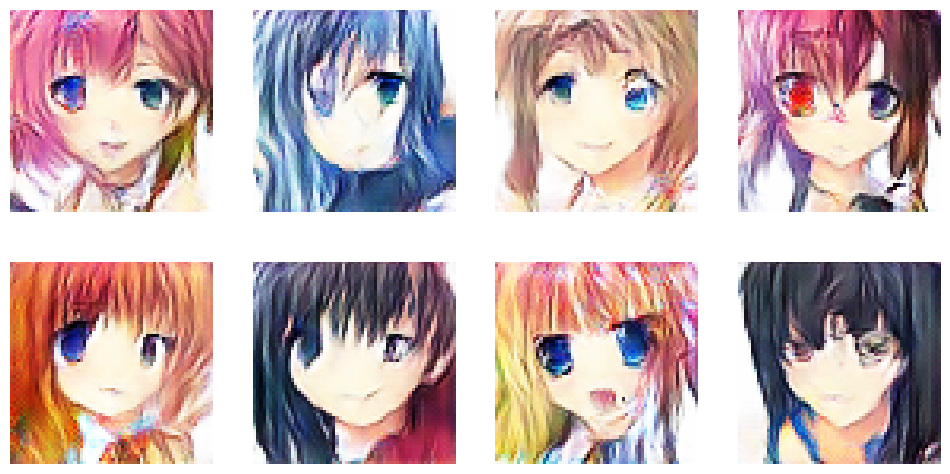

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6948 - g_loss: 0.7941
Epoch 21/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6908 - g_loss: 0.7991

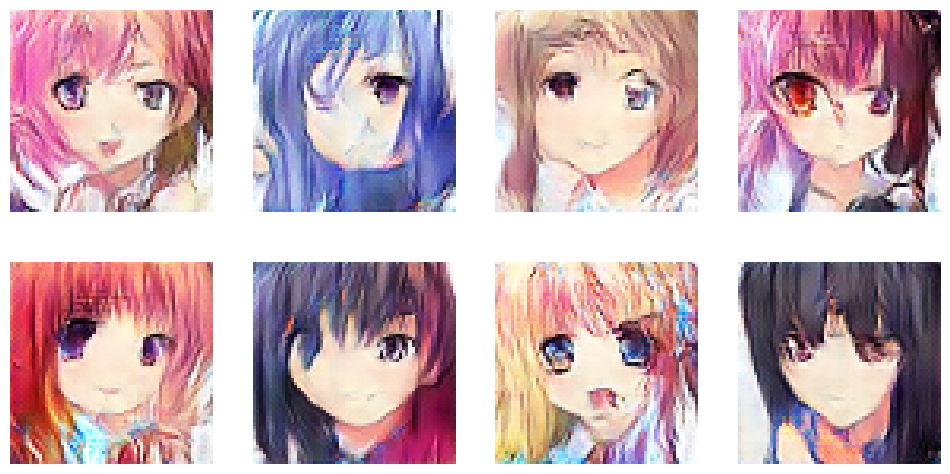

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6908 - g_loss: 0.7991
Epoch 22/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6945 - g_loss: 0.8081

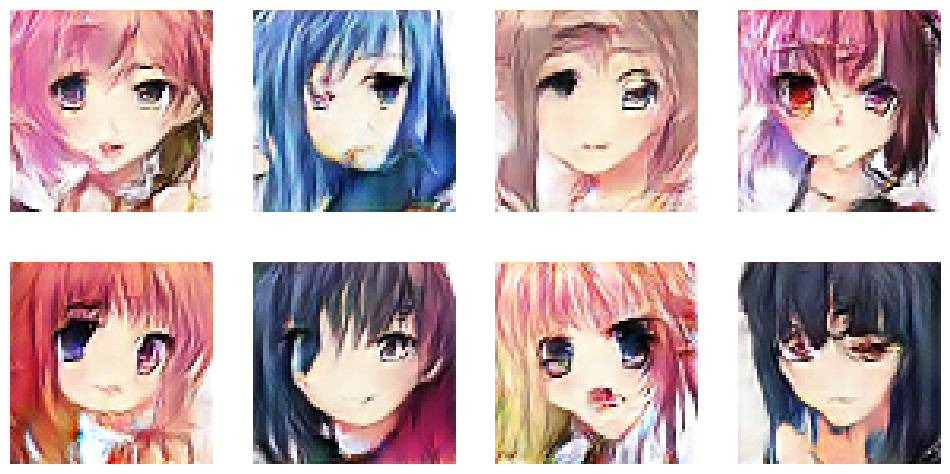

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6945 - g_loss: 0.8081
Epoch 23/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6877 - g_loss: 0.8029

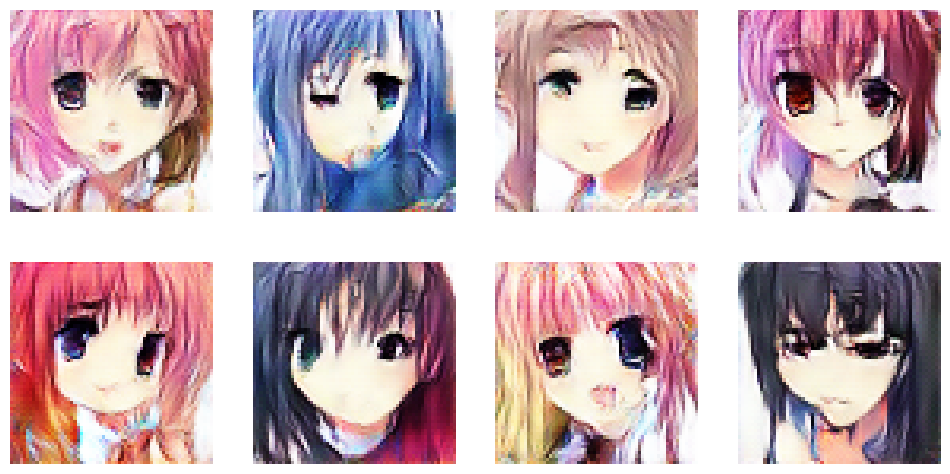

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6877 - g_loss: 0.8029
Epoch 24/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6856 - g_loss: 0.8135

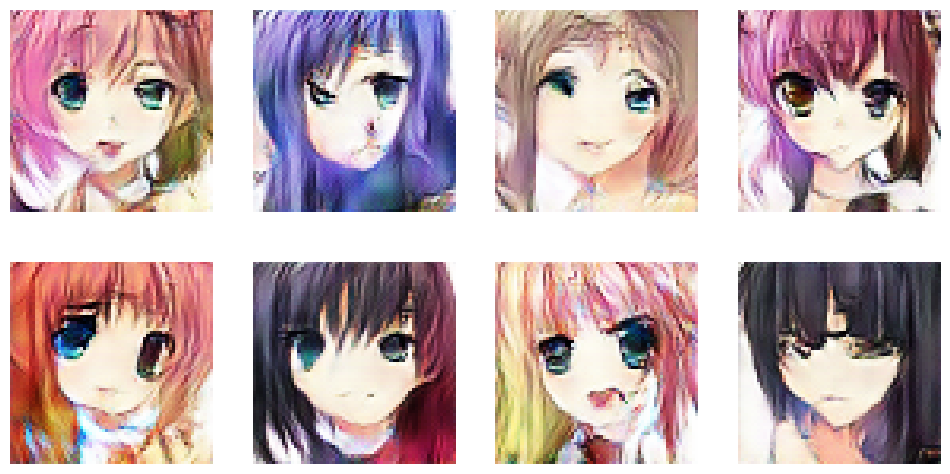

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6856 - g_loss: 0.8134
Epoch 25/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6838 - g_loss: 0.8113

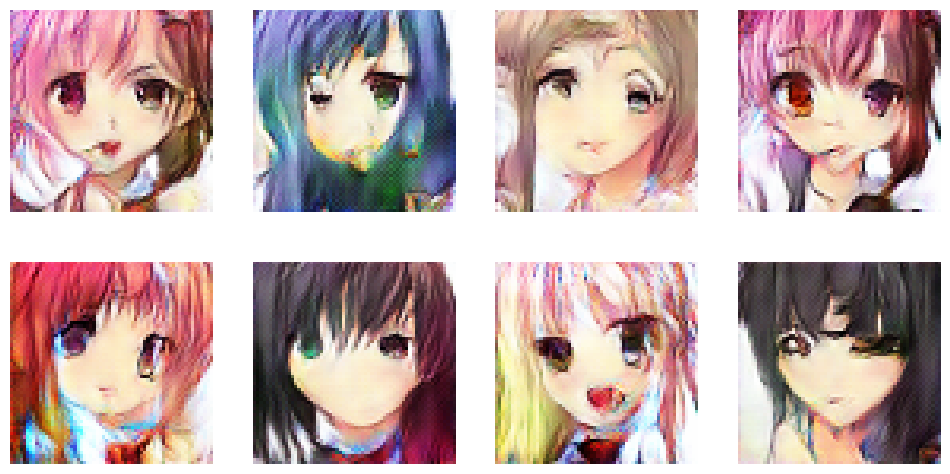

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6838 - g_loss: 0.8113
Epoch 26/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6790 - g_loss: 0.8111

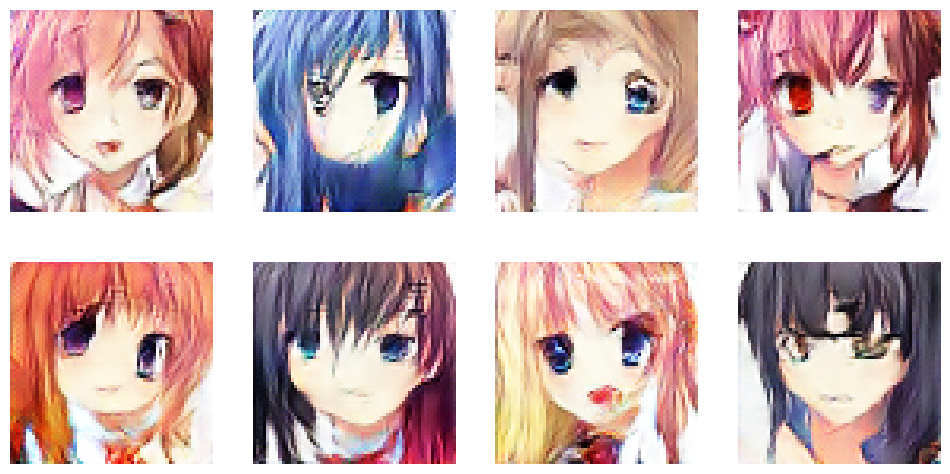

674/674 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - d_loss: 0.6790 - g_loss: 0.8111
Epoch 27/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6789 - g_loss: 0.8168

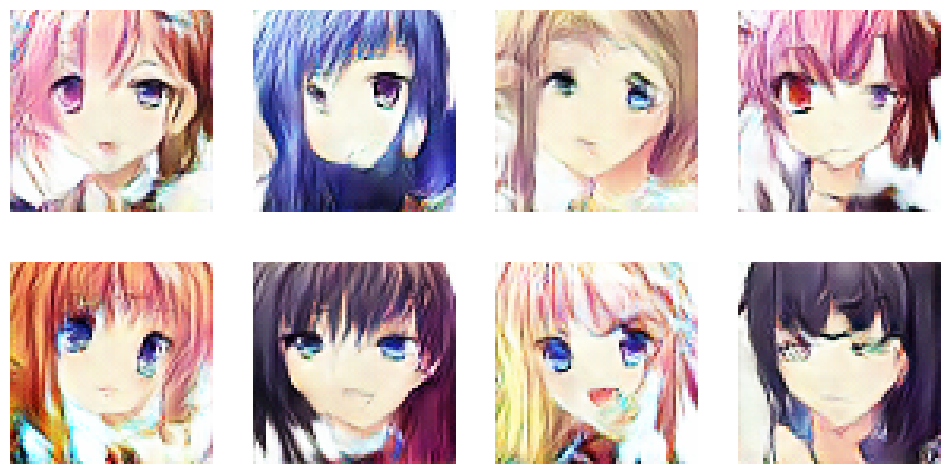

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6789 - g_loss: 0.8168
Epoch 28/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6751 - g_loss: 0.8166

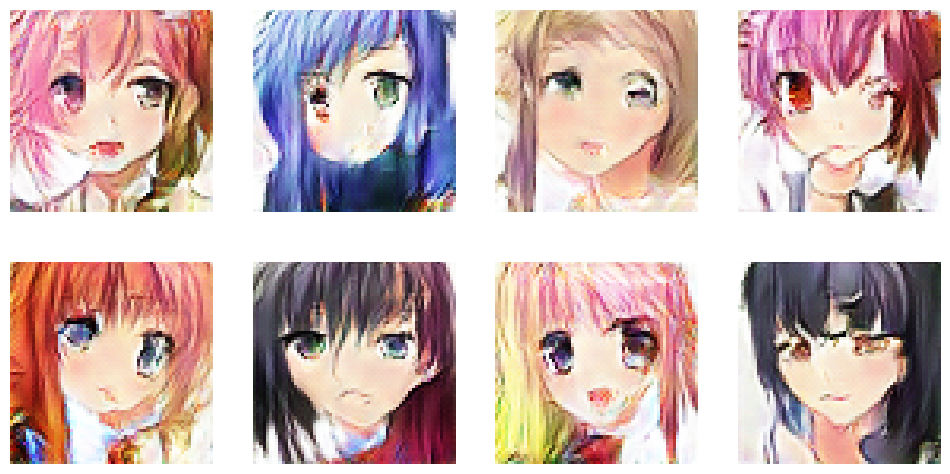

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6751 - g_loss: 0.8166
Epoch 29/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6711 - g_loss: 0.8344

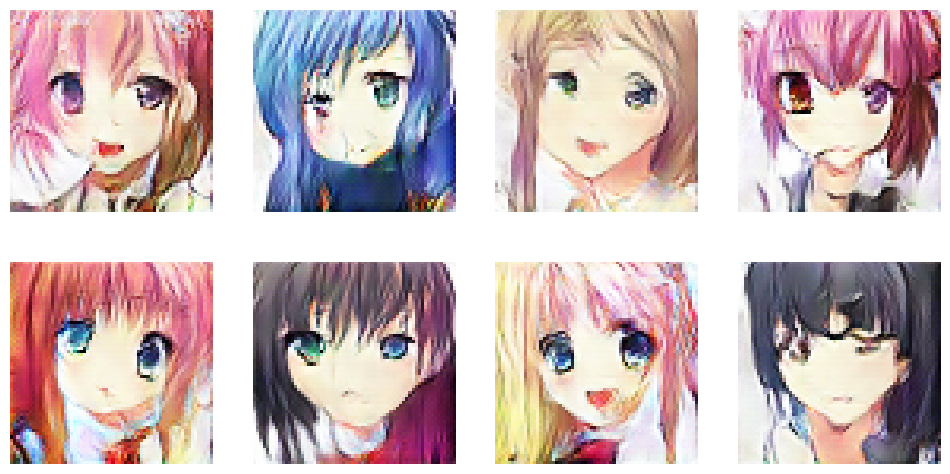

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6711 - g_loss: 0.8344
Epoch 30/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6683 - g_loss: 0.8391

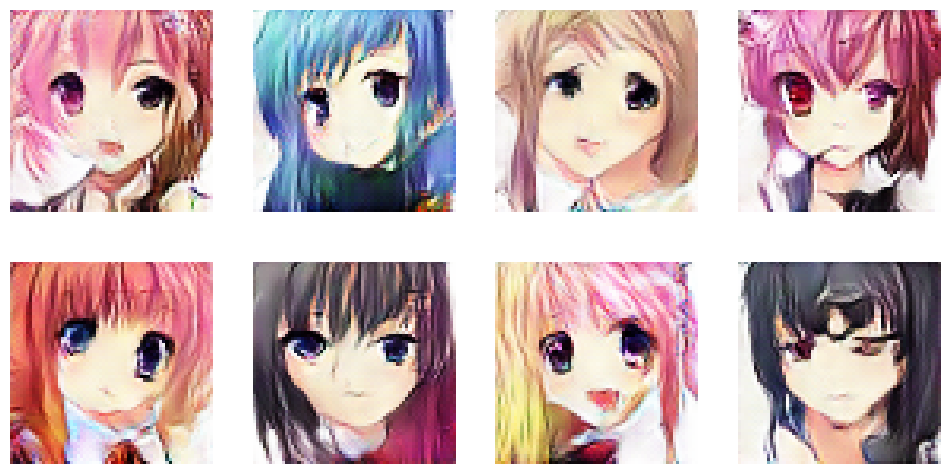

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6683 - g_loss: 0.8391
Epoch 31/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6676 - g_loss: 0.8384

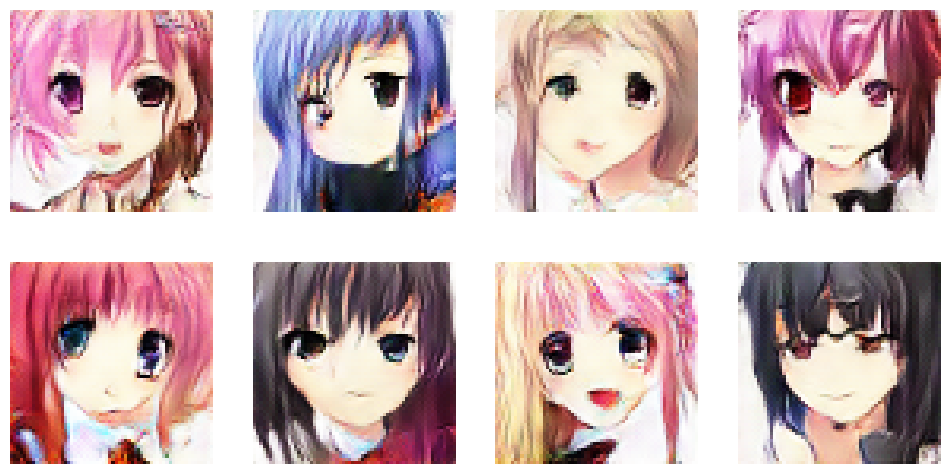

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6676 - g_loss: 0.8384
Epoch 32/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6643 - g_loss: 0.8489

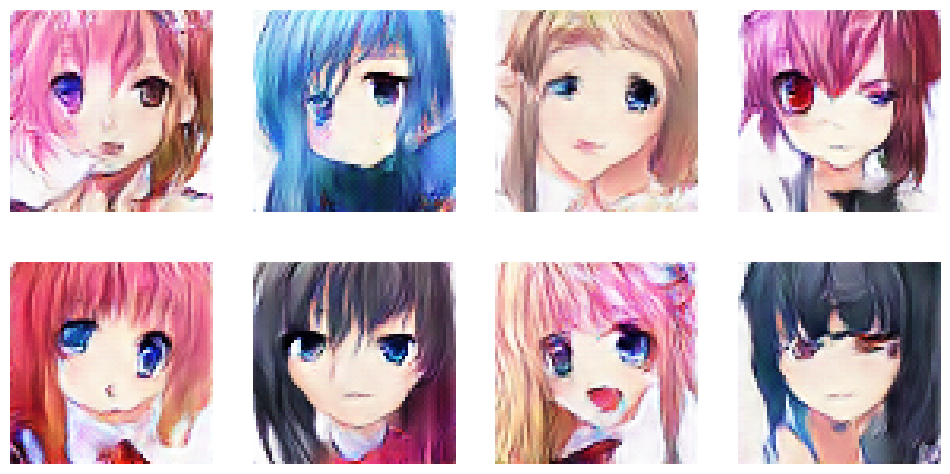

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6643 - g_loss: 0.8489
Epoch 33/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6583 - g_loss: 0.8577

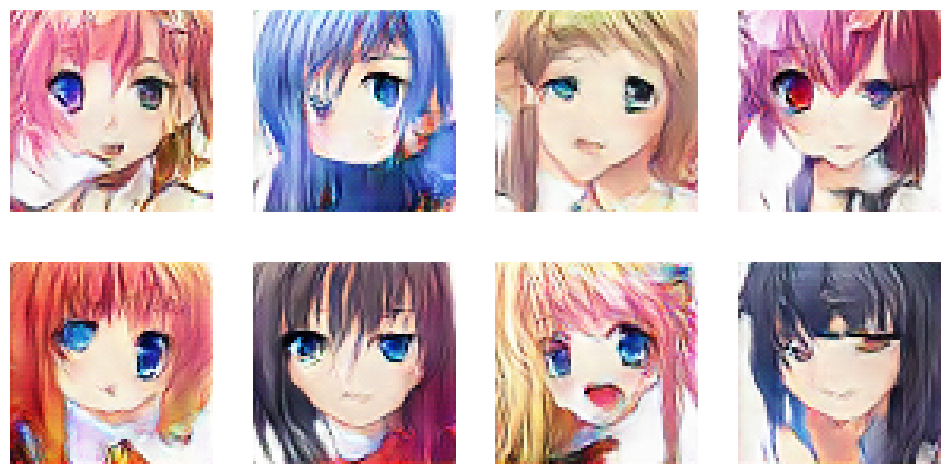

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6583 - g_loss: 0.8577
Epoch 34/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6540 - g_loss: 0.8794

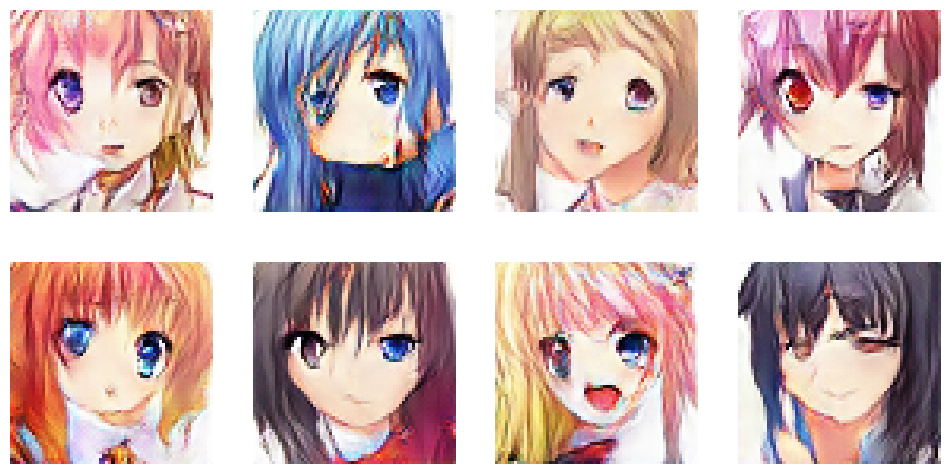

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6540 - g_loss: 0.8794
Epoch 35/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6489 - g_loss: 0.8804

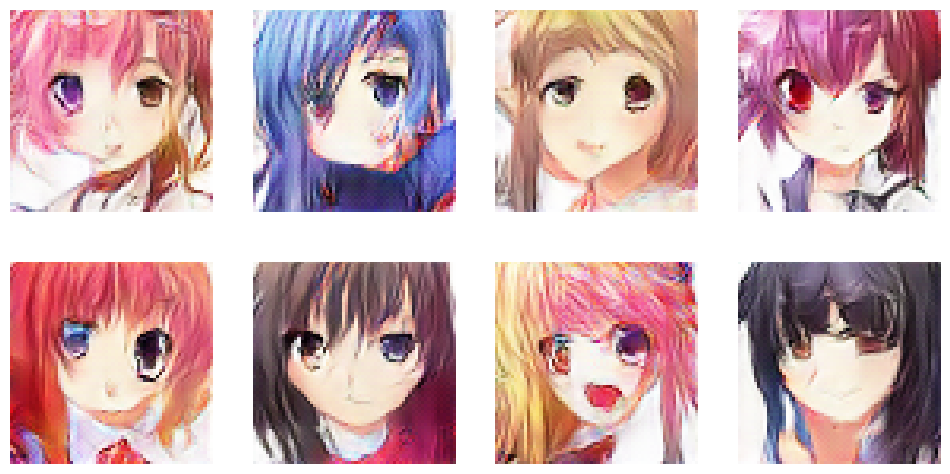

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6489 - g_loss: 0.8804
Epoch 36/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6491 - g_loss: 0.8923

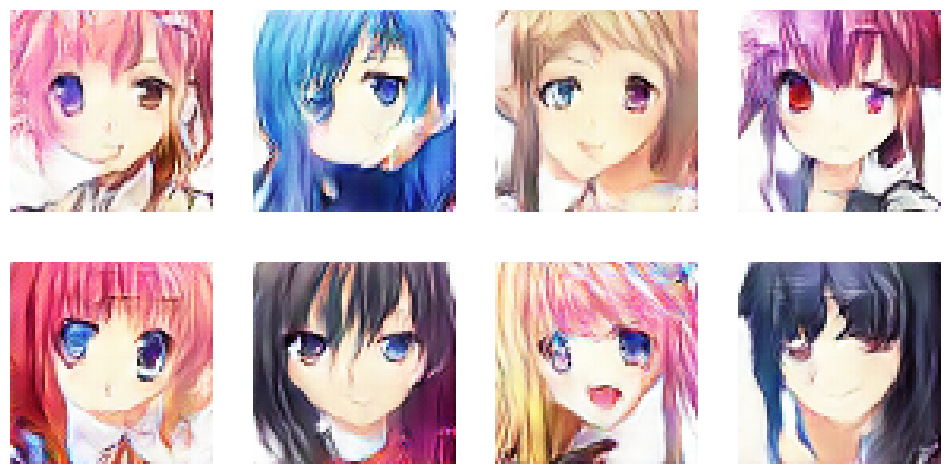

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6491 - g_loss: 0.8923
Epoch 37/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6431 - g_loss: 0.9122

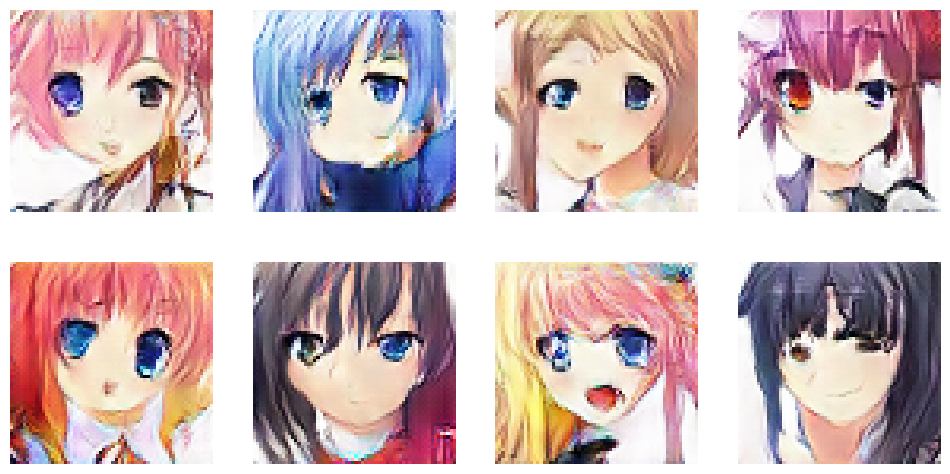

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6431 - g_loss: 0.9122
Epoch 38/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6360 - g_loss: 0.9217

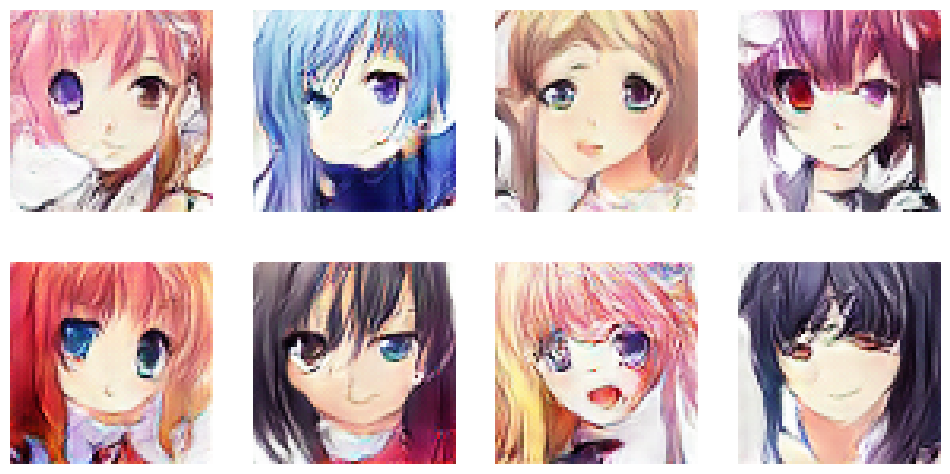

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6360 - g_loss: 0.9217
Epoch 39/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6331 - g_loss: 0.9248

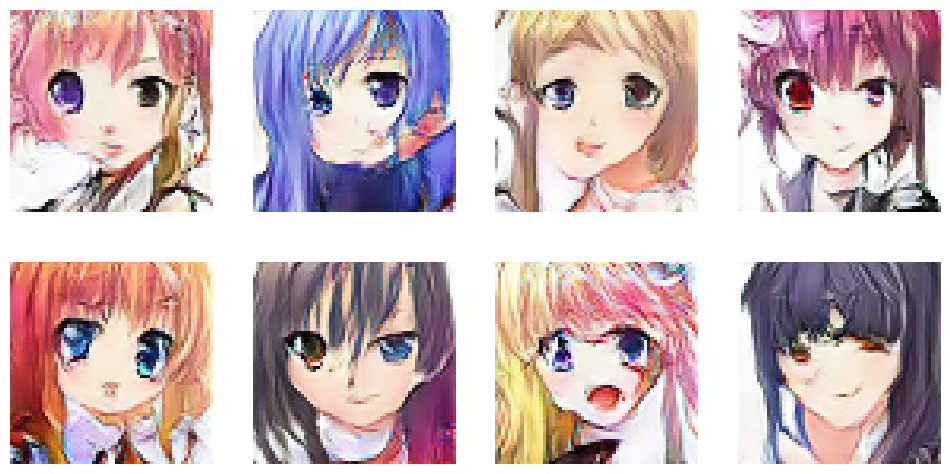

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6331 - g_loss: 0.9248
Epoch 40/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6302 - g_loss: 0.9448

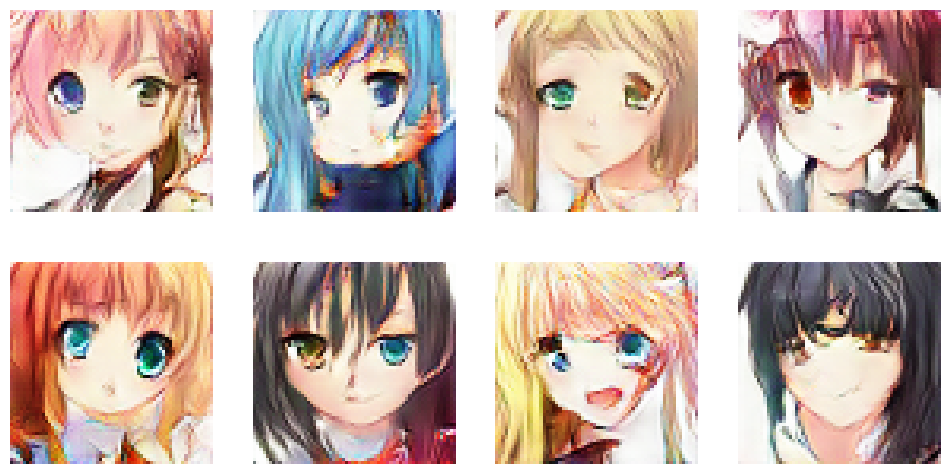

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6302 - g_loss: 0.9448
Epoch 41/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6273 - g_loss: 0.9596

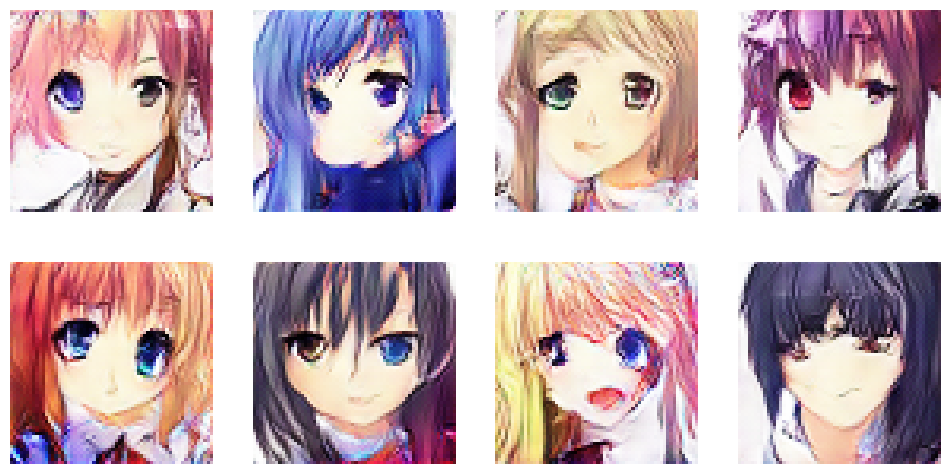

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6273 - g_loss: 0.9596
Epoch 42/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6179 - g_loss: 0.9705

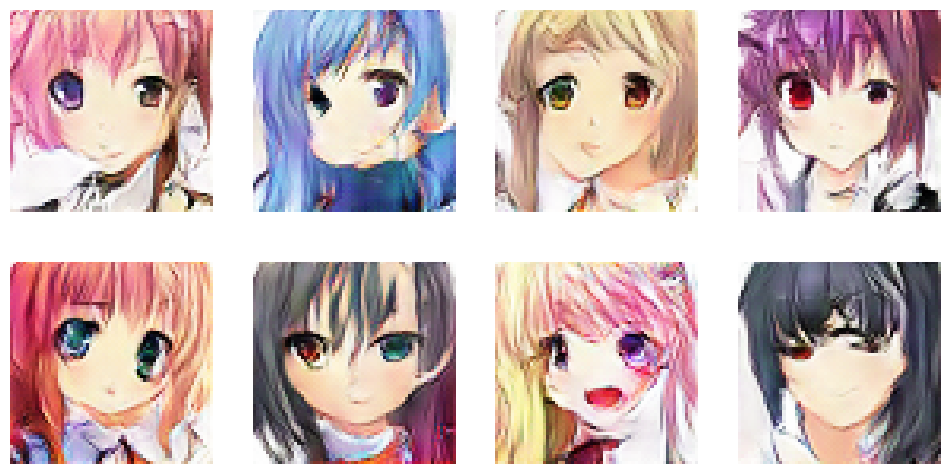

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6179 - g_loss: 0.9705
Epoch 43/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6188 - g_loss: 0.9910

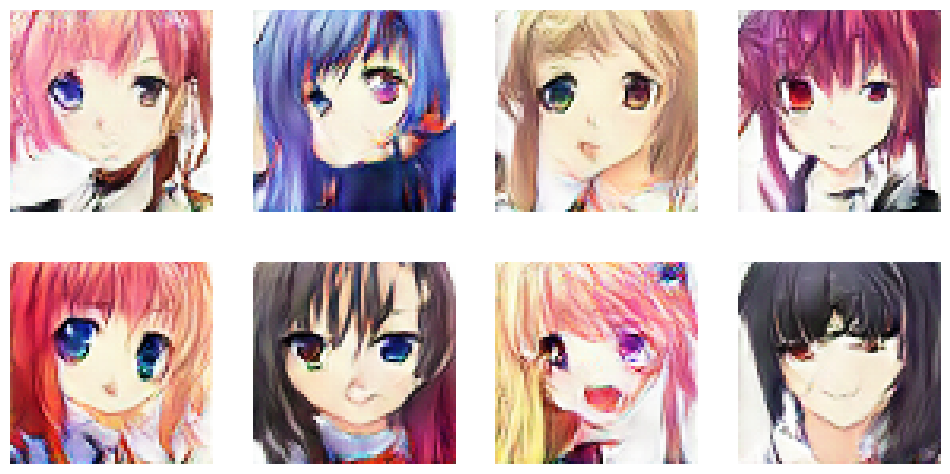

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.6188 - g_loss: 0.9910
Epoch 44/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6140 - g_loss: 0.9974

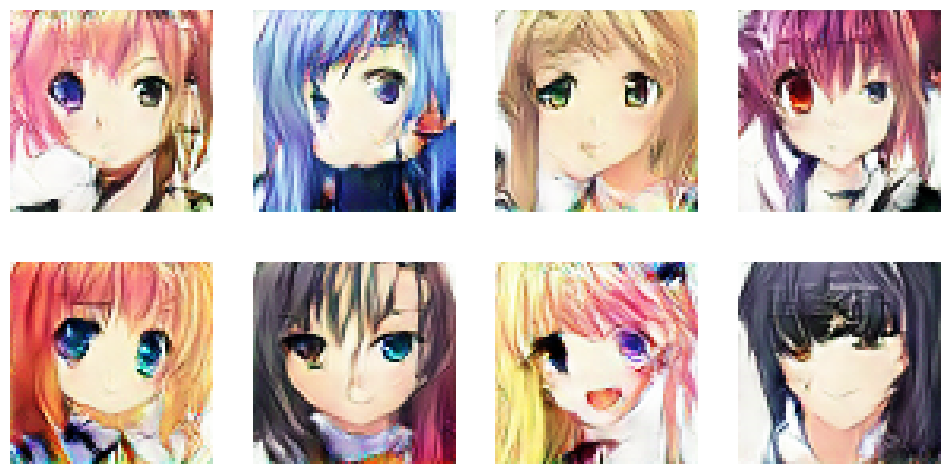

674/674 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - d_loss: 0.6140 - g_loss: 0.9974
Epoch 45/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.6085 - g_loss: 1.0188

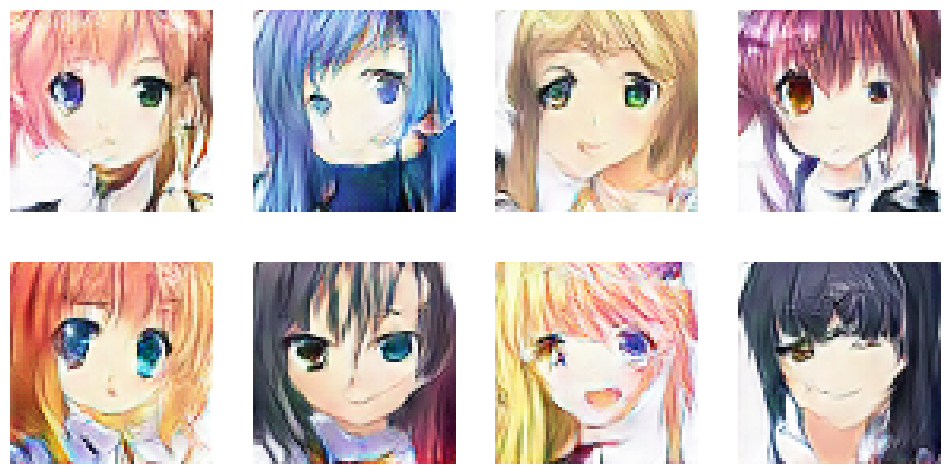

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.6085 - g_loss: 1.0188
Epoch 46/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.5996 - g_loss: 1.0331

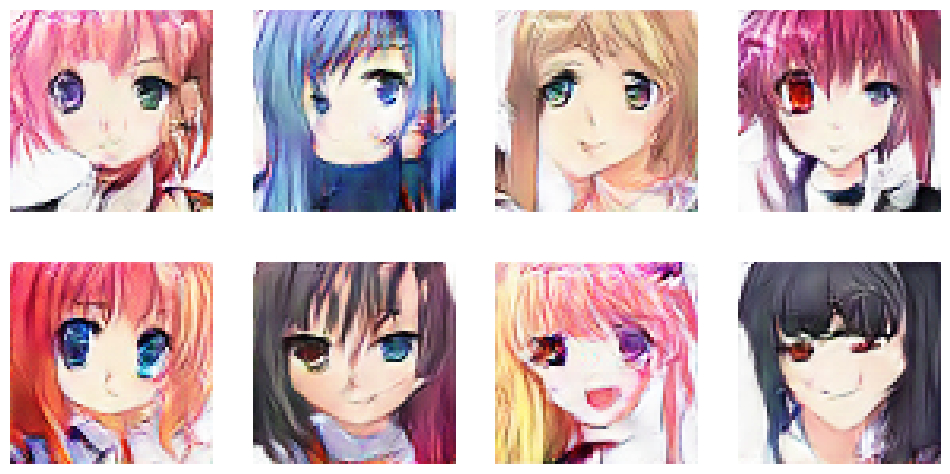

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.5996 - g_loss: 1.0331
Epoch 47/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.5966 - g_loss: 1.0552

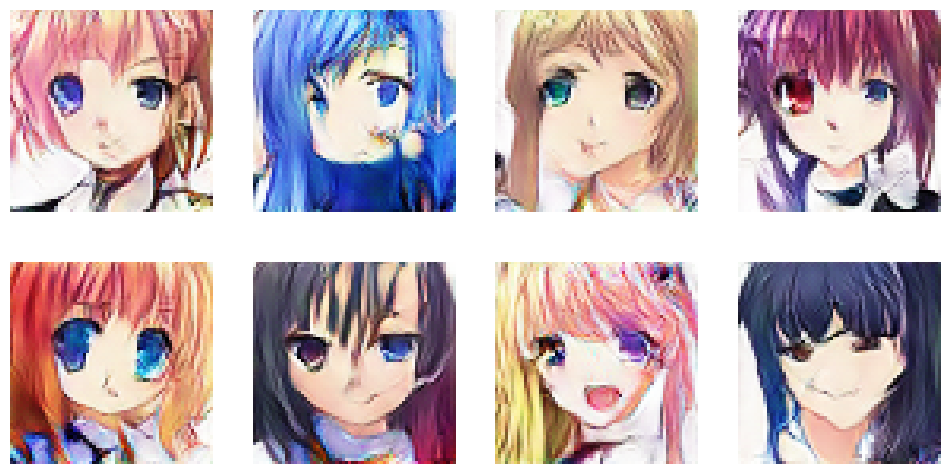

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.5966 - g_loss: 1.0552
Epoch 48/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.5922 - g_loss: 1.0806

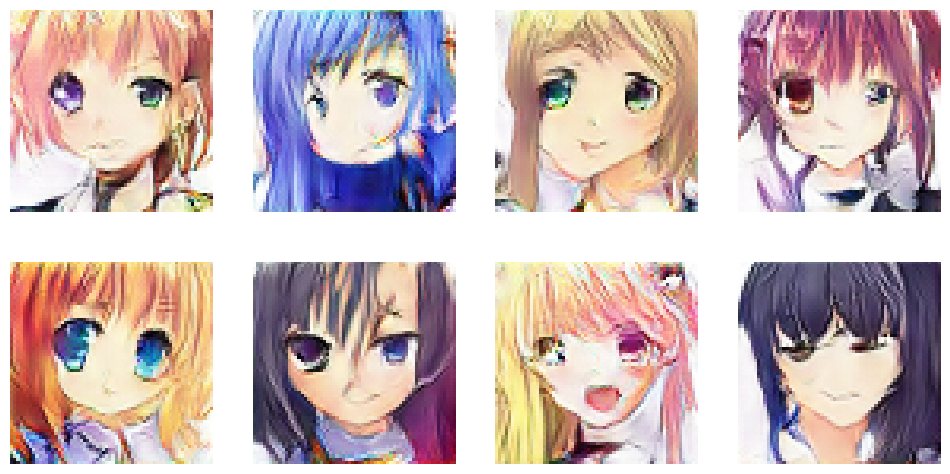

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.5922 - g_loss: 1.0805
Epoch 49/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.5878 - g_loss: 1.0932

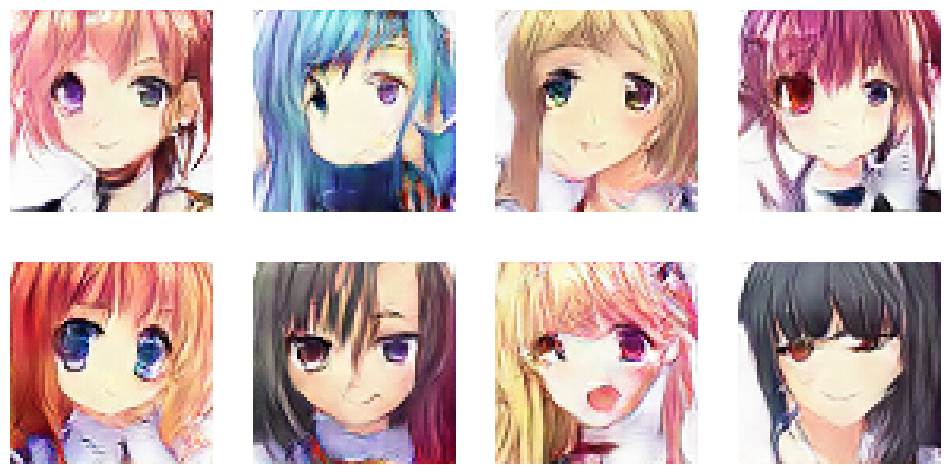

674/674 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - d_loss: 0.5878 - g_loss: 1.0932
Epoch 50/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.5820 - g_loss: 1.1018

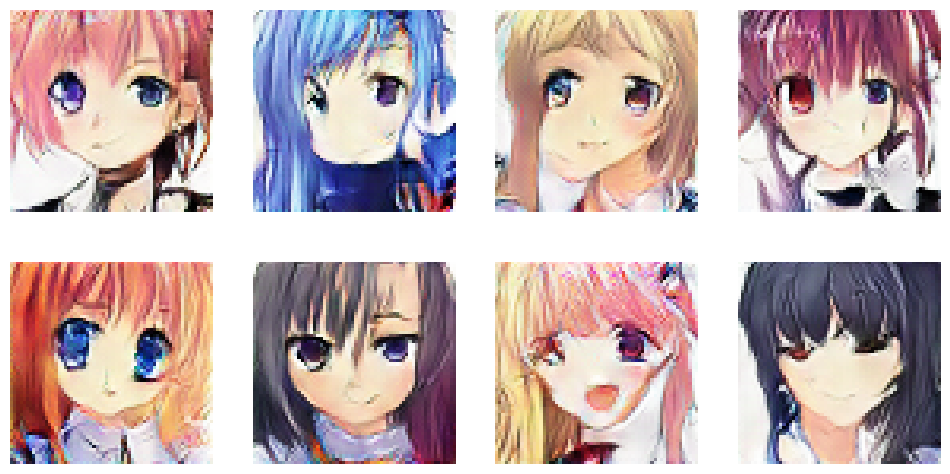

674/674 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - d_loss: 0.5820 - g_loss: 1.1018


In [21]:
N_EPOCHS = 50
dcgan.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])

## Generate New Anime Images

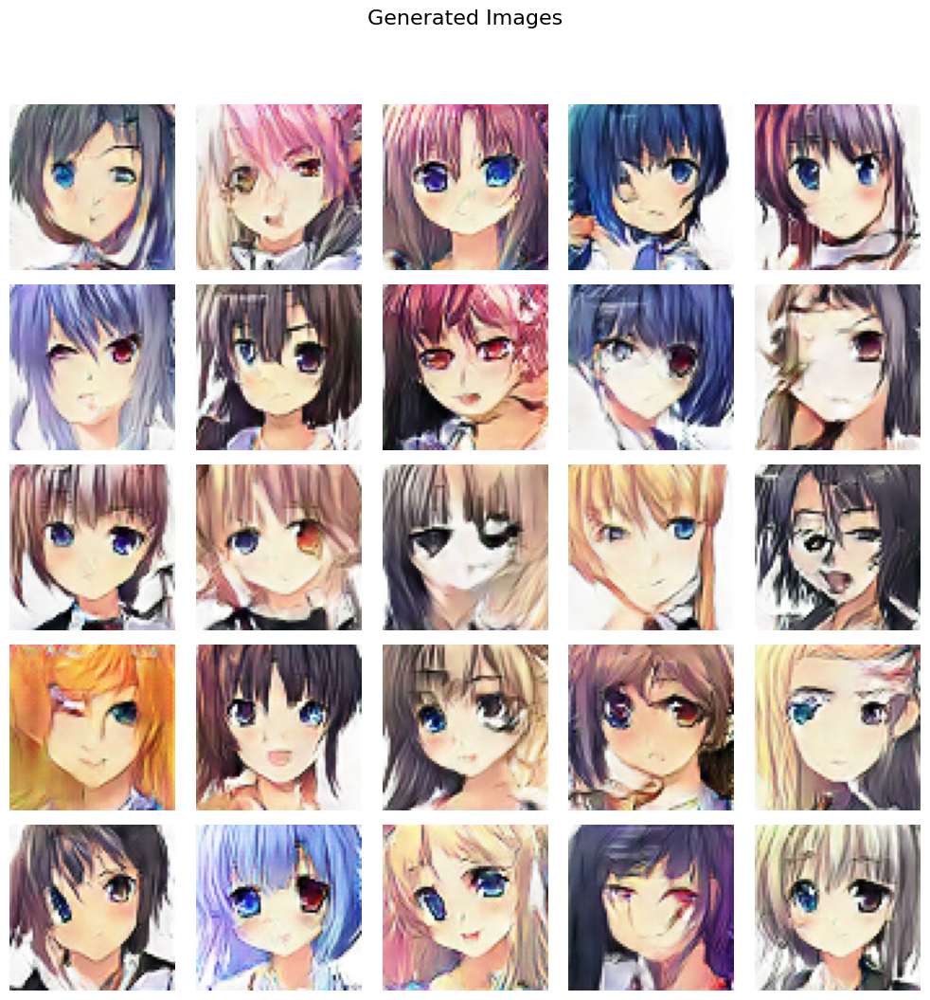

In [24]:
# Generate images
num_images = 25
noise = tf.random.normal([num_images, 100])
generated_images = dcgan.generator(noise)

# Denormalize the images
generated_images = (generated_images * 127.5) + 127.5
generated_images = np.clip(generated_images, 0, 255).astype(np.uint8)

# Plot the images
fig, axs = plt.subplots(5, 5, figsize=(10, 10))  # 5 columns, 5 images in each row
axs = axs.ravel()

for i in range(num_images):
    img = array_to_img(generated_images[i])
    img = img.resize((64, 64))  # Resize the images
    axs[i].imshow(img)
    axs[i].axis('off')

plt.suptitle('Generated Images', fontsize=16, y=1.05)  # Title indicating generated images
plt.tight_layout()
plt.show()

# Calculating FID-Score

In [27]:
def calculate_activation_statistics(images, model):
    # Scale images to the range of [-1, 1]
    images = (images - 127.5) / 127.5
    # Resize images to 299x299 for Inception-v3 model
    images_resized = tf.image.resize(images, (299, 299))
    # Preprocess images for Inception-v3 model
    images_preprocessed = preprocess_input(images_resized)
    # Get activations of the last convolutional layer
    activations = model.predict(images_preprocessed)
    # Flatten the activations
    activations = activations.reshape(activations.shape[0], -1)
    # Calculate mean and covariance
    mean = np.mean(activations, axis=0)
    covariance = np.cov(activations, rowvar=False)
    return mean, covariance

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    # Calculate sum of squared differences between means
    ssdiff = np.sum((mu1 - mu2)**2)
    # Calculate square root of product of covariances
    covmean = sqrtm(sigma1.dot(sigma2))
    # Check and correct imaginary numbers from sqrtm
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    # Calculate FID score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

# Initialize Inception-v3 model
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

# Generate fake images
num_fake_images = 1000  # Adjust this based on your need
fake_noise = tf.random.normal(shape=(num_fake_images, LATENT_DIM))
fake_images = generator(fake_noise, training=False)
fake_images = (fake_images * 127.5) + 127.5  # Denormalize images

# Calculate statistics for real and fake images
real_mean, real_covariance = calculate_activation_statistics(train_images[:num_fake_images], inception_model)
fake_mean, fake_covariance = calculate_activation_statistics(fake_images, inception_model)

# Calculate FID score
fid_score = calculate_frechet_distance(real_mean, real_covariance, fake_mean, fake_covariance)
print("FID Score:", fid_score)


32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step
FID Score: 1.305843009213694e+19


## Reconstruction Loss

In [28]:
def calculate_reconstruction_loss(original_images, generated_images):
    # Scale images to the range of [-1, 1]
    original_images = (original_images - 127.5) / 127.5
    generated_images = (generated_images - 127.5) / 127.5
    # Calculate Mean Squared Error (MSE) loss
    reconstruction_loss = tf.reduce_mean(tf.square(original_images - generated_images))
    return reconstruction_loss
# Reconstruction Loss Calculation
reconstruction_loss = calculate_reconstruction_loss(train_images[:num_images], generated_images)
print("Reconstruction Loss:", reconstruction_loss.numpy())

Reconstruction Loss: 1.7848824527035427


In [33]:
# Function to calculate Inception Score
def calculate_inception_score(images, inception_model, num_splits=10):
    # Scale images to the range of [-1, 1]
    images = (images - 127.5) / 127.5
    # Resize images to 299x299 for Inception-v3 model
    images_resized = tf.image.resize(images, (299, 299))
    # Preprocess images for Inception-v3 model
    images_preprocessed = preprocess_input(images_resized)

    preds = []
    # Split the dataset into several batches
    for i in range(num_splits):
        # Get predictions from the Inception-v3 model
        preds.append(inception_model.predict(images_preprocessed[i * (images.shape[0] // num_splits):(i + 1) * (images.shape[0] // num_splits)]))

    # Stack predictions
    preds = np.concatenate(preds, axis=0)

    # Calculate p(y|x) by averaging softmax probabilities across the splits
    p_yx = np.mean(preds, axis=0)

    # Calculate marginal entropy H(y) of p(y)
    H_y = -np.sum(p_yx * np.log(p_yx + 1e-12))

    # Calculate conditional entropy H(y|x) of p(y|x)
    H_yx = -np.sum(preds * np.log(preds + 1e-12), axis=1)
    # Take the exponential of H(y|x) and compute the average across samples
    exp_H_yx = np.mean(np.exp(H_yx))

    # Calculate Inception score
    inception_score = np.exp(H_y - exp_H_yx)

    return inception_score

# Calculate Inception score for multiple splits
inception_scores = []
num_splits = 10  # You can adjust the number of splits as needed
for i in range(num_splits):
    inception_scores.append(calculate_inception_score(generated_images, inception_model))

# Calculate mean and standard deviation of Inception scores
inception_scores_mean = np.mean(inception_scores)
inception_scores_std = np.std(inception_scores)

# Print mean and standard deviation of Inception scores
print("Inception Score (Mean):", inception_scores_mean)
print("Inception Score (Standard Deviation):", inception_scores_std)

Inception Score (mean): 1.8536246
Inception Score (std): 1.6797137
